In [2]:
# Import Plot.ly functions for both online/offline
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

# Import extra modules as needed
import numpy as np

from dataChest import dataChest

init_notebook_mode()

from probeStationAnalysis import probeTest

## Ox6 ##

Mean R:   {0.0732: 7121.71426, 0.048: 9564.500608, 0.0244: 17531.195, 0.012: 26849.3644}
Mean J_c:   {0.0732: 57.250311254113086, 0.048: 65.00846949634905, 0.0244: 69.77054753789271, 0.012: 92.63139890536551}
Theory:  {0.0732: 6058.251976936935, 0.048: 9238.834264828824, 0.0244: 18174.755930810803, 0.012: 36955.337059315294}
m = 0.00174327695556  b = 1.75455764616e-05  R_sub = 56994.4226221


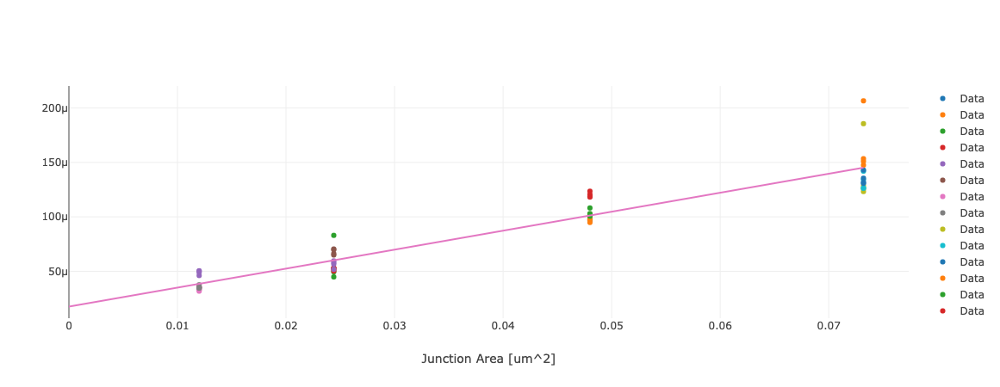

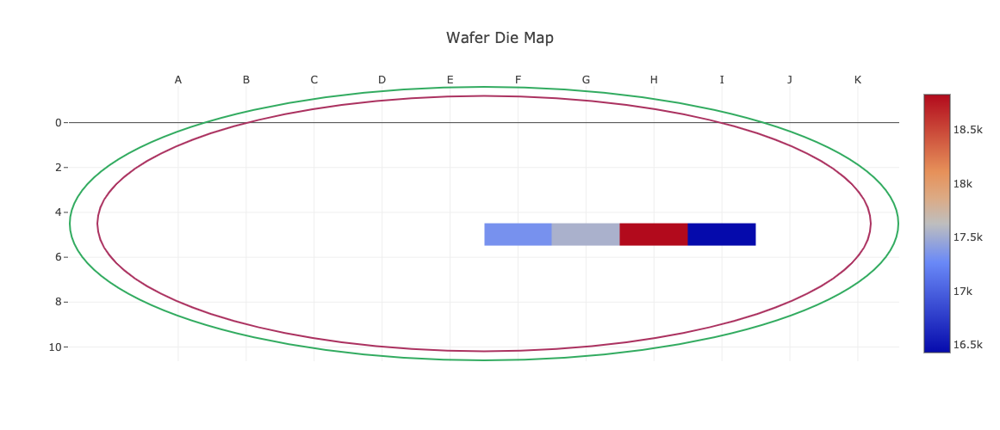

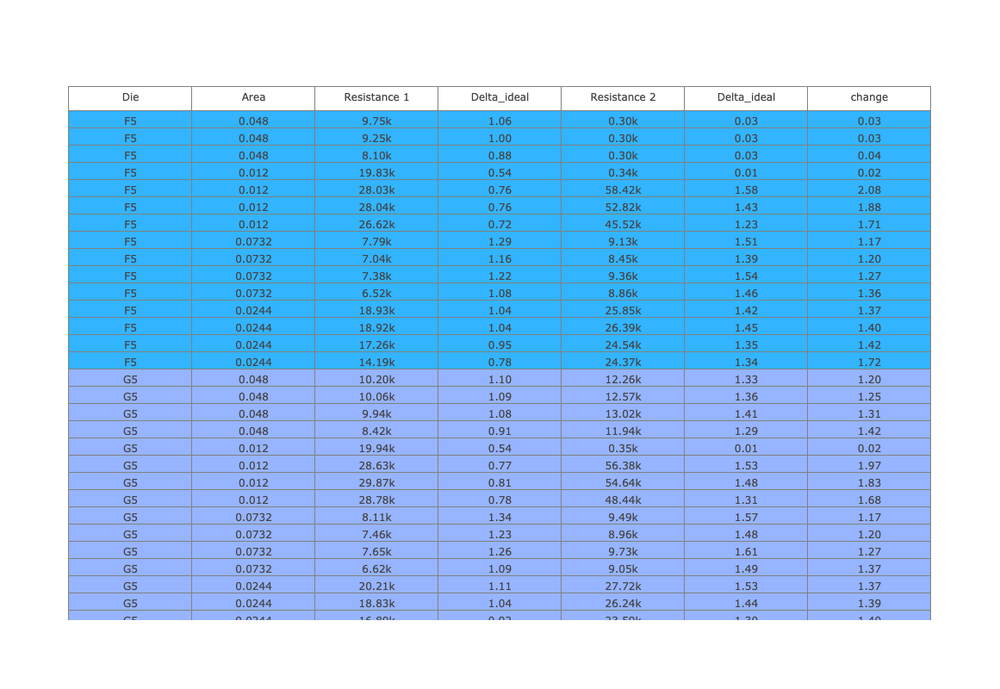

In [5]:
test = probeTest(['fluxNoise_probe_station','cfv2021ded_CW20181211B-Ox6.hdf5'], bounds={480:(500,100000)})

test.removeOverwrittenData()
test.addSubstrateCalibration(['fluxNoise_probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
#test.displayDataTable()
test.dieMap(0.0244)

# compare with after ozone treatment
chest = dataChest(['fluxNoise_probe_station'])
chest.openDataset('cfx0248bdx_CW20181211B-Ox6-afterOzone.hdf5')

dataOrder = ('die', 'index', 'area', 'range', 'resistance')
later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
for row in test.data:
    row['later_resistance'] = np.nan
    for line in later_data:
        if row['die']==line['die'] and row['index']==line['index']:
            row['later_resistance'] = line['resistance']
colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Die', 'Area', 'Resistance 1', 'Delta_ideal', 'Resistance 2', 'Delta_ideal', 'change']),
    cells=dict(values=[[row['die'] for row in test.data],
                       [row['area'] for row in test.data],
                       ['{:.2f}k'.format(row['resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}k'.format(row['later_resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/row['resistance']) for row in test.data]],
                fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=800))
iplot(fig, filename = 'basic_table')

## Ox7 ##

Mean R:   {0.0732: 6802.513013333333, 0.048: 9533.999906666666, 0.0244: 15988.769066666664, 0.012: 28252.3744}
Mean J_c:   {0.0732: 59.93672592006797, 0.048: 65.21644137925821, 0.0244: 76.50126592256619, 0.012: 88.03133318564261}
Theory:  {0.0732: 6058.251976936935, 0.048: 9238.834264828824, 0.0244: 18174.755930810803, 0.012: 36955.337059315294}
m = 0.0018143844188  b = 1.64525732789e-05  R_sub = 60780.7656012


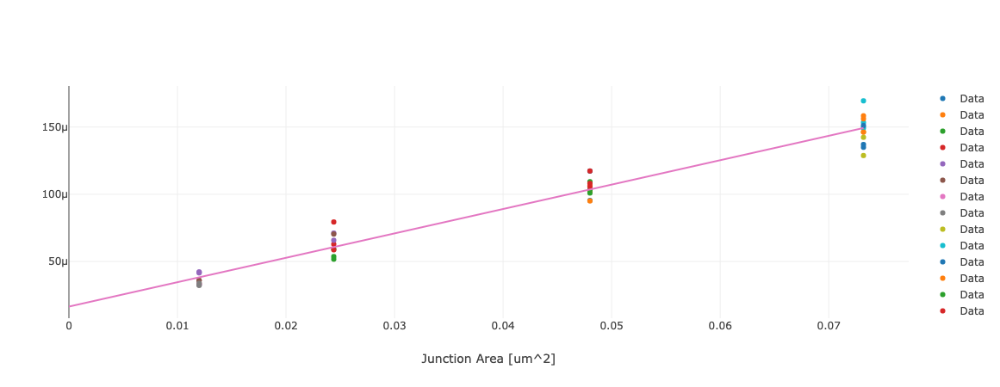

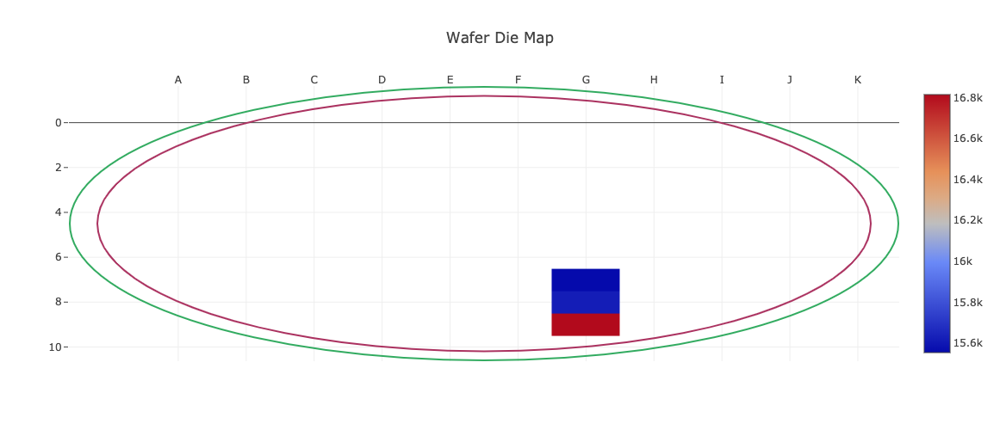

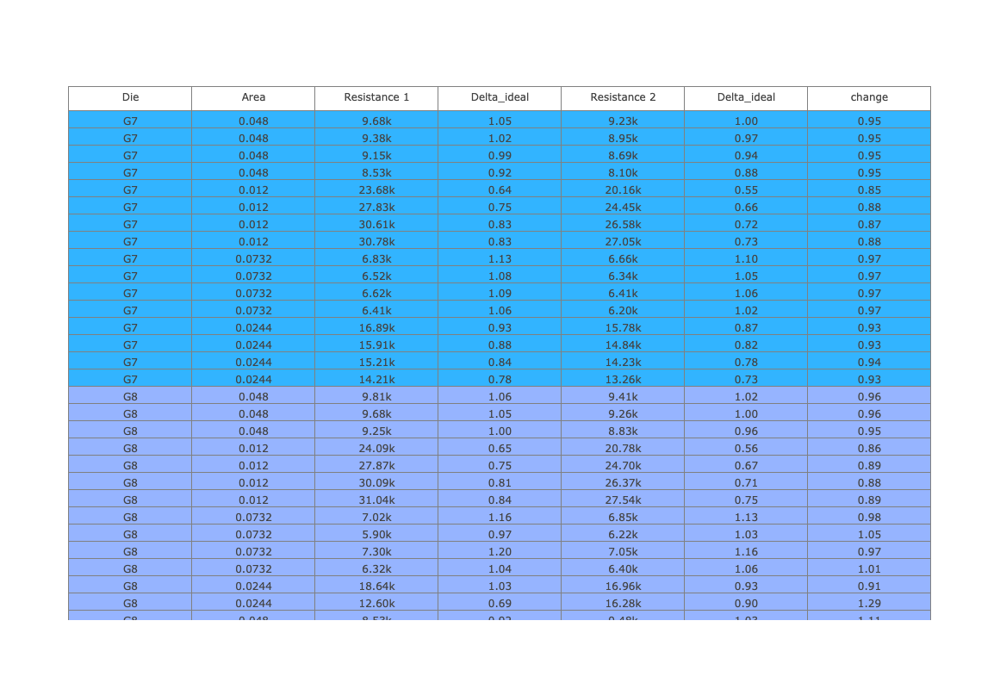

In [7]:
test = probeTest(['fluxNoise_probe_station','cga0000sfn_CW20181211B-Ox7.hdf5'], bounds={244:(3000,1e8)})

test.removeOverwrittenData()
test.addSubstrateCalibration(['fluxNoise_probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
#test.displayDataTable()
test.dieMap(0.0244)

# compare after several days
chest = dataChest(['fluxNoise_probe_station'])
chest.openDataset('cgb1720pft_CW20181211B-Ox7-remeasured.hdf5')

dataOrder = ('die', 'index', 'area', 'range', 'resistance')
later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
for row in test.data:
    row['later_resistance'] = np.nan
    for line in later_data:
        if row['die']==line['die'] and row['index']==line['index']:
            row['later_resistance'] = line['resistance']
colors = ['rgb({},180,255)'.format( 50+100*((ord(row['die'][0])+int(row['die'][1]))%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Die', 'Area', 'Resistance 1', 'Delta_ideal', 'Resistance 2', 'Delta_ideal', 'change']),
    cells=dict(values=[[row['die'] for row in test.data],
                       [row['area'] for row in test.data],
                       ['{:.2f}k'.format(row['resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}k'.format(row['later_resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/row['resistance']) for row in test.data]],
                fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=800))
iplot(fig, filename = 'basic_table')

## Ox8 ##

Mean R:   {0.0732: 89387.093, 0.048: 94582.9242, 0.0244: 79746.844, 0.012: 82070.0736}
Mean J_c:   {0.0732: 4.561288932931913, 0.048: 6.573845662756322, 0.0244: 15.338049918860325, 0.012: 30.30451996684842}
Theory:  {0.0732: 6058.251976936935, 0.048: 9238.834264828824, 0.0244: 18174.755930810803, 0.012: 36955.337059315294}
m = -4.49033225006e-05  b = 1.41368507722e-05  R_sub = 70737.1122544


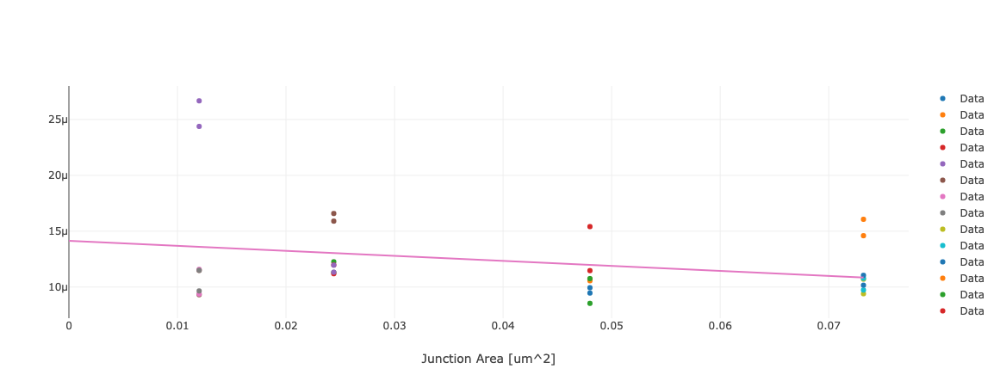

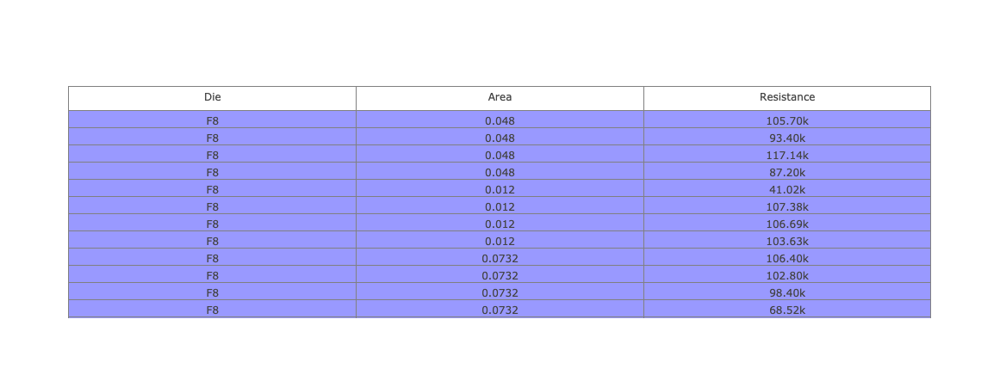

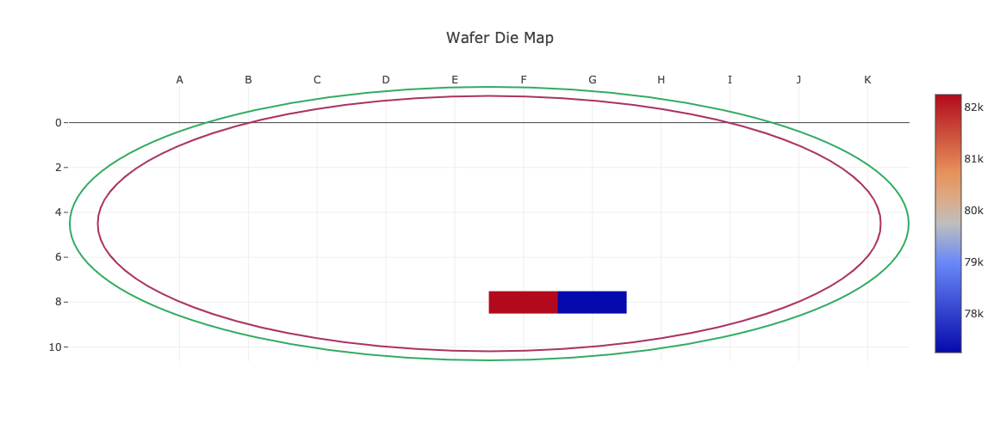

In [8]:
test = probeTest(['fluxNoise_probe_station','cgj2004tce_CW20181211B-Ox8.hdf5'], bounds={244:(3000,1e8)})

test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
test.displayDataTable()
test.dieMap(0.0244)

## Ox9 ##

Mean R:   {0.0732: 3992.1947600000008, 0.048: 5308.2137, 0.0244: 11534.790026666666, 0.012: 17422.63257142857}
Mean J_c:   {0.0732: 102.1293755838344, 0.048: 117.13423406879416, 0.0244: 106.04103510474017, 0.012: 142.75076822606667}
Theory:  {0.0732: 6058.251976936935, 0.048: 9238.834264828824, 0.0244: 18174.755930810803, 0.012: 36955.337059315294}
m = 0.00329655371548  b = 1.79874586779e-05  R_sub = 55594.2903278


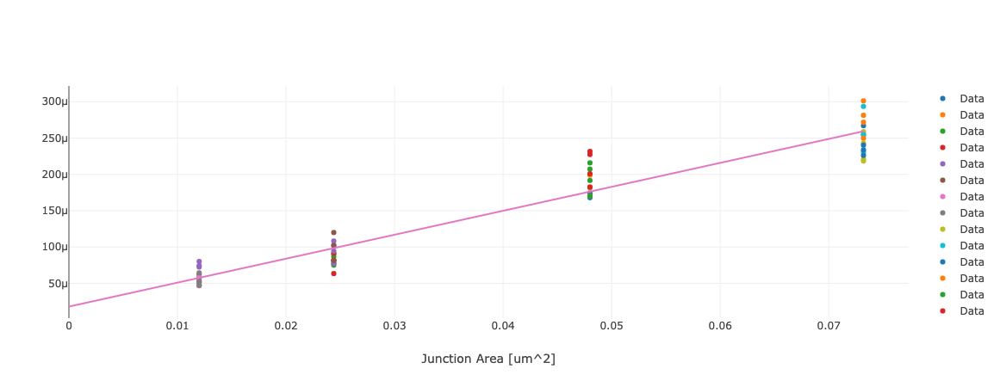

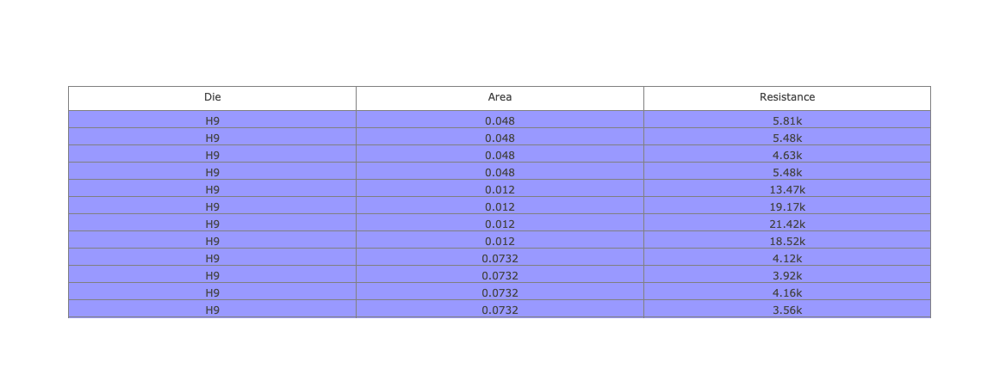

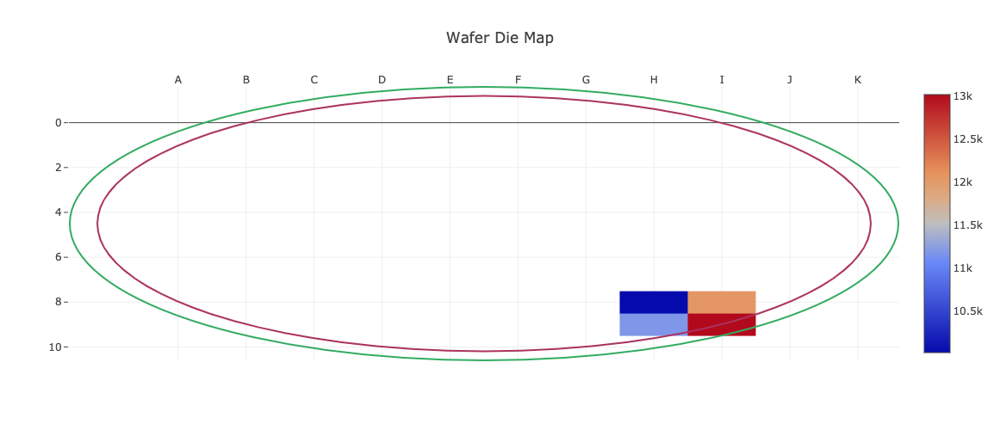

In [9]:
test = probeTest(['fluxNoise_probe_station','cgk1758zes_CW20181211B-Ox9.hdf5'], bounds={120:(500,1e8), 244:(500,1e8)})

test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
test.displayDataTable()
test.dieMap(0.0244)